# Analyze and compute CV of the model

In [1]:
import sys
sys.path.insert(0, "effdet2/")
import effdet

from metric import calculate_microf1
import torch
import os
from datetime import datetime
import time
import random
import cv2
import pandas as pd
import numpy as np
import albumentations as A
import matplotlib.pyplot as plt
from albumentations.pytorch.transforms import ToTensorV2
from sklearn.model_selection import StratifiedKFold
from torch.utils.data import Dataset,DataLoader
from torch.utils.data.sampler import SequentialSampler, RandomSampler
from glob import glob
import pandas as pd
from effdet import get_efficientdet_config, EfficientDet, DetBenchTrain
from effdet.efficientdet import HeadNet
from tqdm import tqdm

SEED = 42
import warnings
warnings.filterwarnings("ignore")

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(SEED)

FILTER_BOTHVIEW = True

In [2]:
ENUM = 50
LR = 1e-4
evalontrain = False
debug = False
cutmix = True
mixup = True

teamcv = True
fold = 0
DATA_ROOT_PATH = "train_images"

In [3]:
IMSIZE = 1024
BSNUM = 4
watermark = "side5-end5-eval-both-{}".format(IMSIZE)

# Set model weights here!
checkpoint_side = "models/best-side-1024-effdet4-epoch6.bin"
checkpoint_end = "models/best-effdet4-1280-end-epoch3.bin"

In [4]:
# Eval options
RUN_ENTIRE = False

## Albumentations

In [5]:
def get_valid_transforms():
    return A.Compose(
        [
            A.Resize(height=IMSIZE, width=IMSIZE, p=1.0),
            ToTensorV2(p=1.0),
        ], 
        p=1.0, 
    )

## Dataset

In [6]:
# read labels
from sklearn.model_selection import GroupKFold
group_kfold = GroupKFold(n_splits=5)

video_labels = pd.read_csv("train_labels_4.csv")
video_labels['fold'] = -1
for i, (train_index, test_index) in enumerate(group_kfold.split(X=range(len(video_labels)), groups=video_labels["gameKey"])):
    video_labels.loc[test_index, "fold"] = i

# validation-split
np.random.seed(0)
video_names = np.random.permutation(video_labels.video.unique())
video_valid = sorted(video_labels[(video_labels["fold"]==fold)].video.unique())
video_train = video_labels[(video_labels["fold"]!=fold)].video.unique()
images_valid = video_labels[ video_labels.video.isin(video_valid)].image_name.unique()
images_train = video_labels[~video_labels.video.isin(video_valid)].image_name.unique()

sorted(video_valid)

['57586_000540_Endzone.mp4',
 '57586_000540_Sideline.mp4',
 '57586_001934_Endzone.mp4',
 '57586_001934_Sideline.mp4',
 '57586_004152_Endzone.mp4',
 '57586_004152_Sideline.mp4',
 '57596_002686_Endzone.mp4',
 '57596_002686_Sideline.mp4',
 '57679_003316_Endzone.mp4',
 '57679_003316_Sideline.mp4',
 '57682_002630_Endzone.mp4',
 '57682_002630_Sideline.mp4',
 '57684_001985_Endzone.mp4',
 '57684_001985_Sideline.mp4',
 '57784_001741_Endzone.mp4',
 '57784_001741_Sideline.mp4',
 '57904_001367_Endzone.mp4',
 '57904_001367_Sideline.mp4',
 '57912_001325_Endzone.mp4',
 '57912_001325_Sideline.mp4',
 '57995_000109_Endzone.mp4',
 '57995_000109_Sideline.mp4',
 '58095_004022_Endzone.mp4',
 '58095_004022_Sideline.mp4']

In [7]:
class DatasetRetriever(Dataset):
    def __init__(self, image_ids, transforms=None):
        super().__init__()
        self.image_ids = image_ids
        self.transforms = transforms

    def __getitem__(self, index: int):
        image_id = self.image_ids[index]
        image = cv2.imread(f'{DATA_ROOT_PATH}/{image_id}', cv2.IMREAD_COLOR).copy().astype(np.float32)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0
        if self.transforms:
            sample = {'image': image}
            sample = self.transforms(**sample)
            image = sample['image']
        return image, image_id

    def __len__(self) -> int:
        return self.image_ids.shape[0]

In [8]:
class TrainGlobalConfig:
    num_workers = 8
    batch_size = BSNUM
    n_epochs = ENUM
    lr = LR
    folder = 'effdet5-'+str(IMSIZE)
    verbose = True
    verbose_step = 1
    step_scheduler = False
    validation_scheduler = True
    SchedulerClass = torch.optim.lr_scheduler.ReduceLROnPlateau
    scheduler_params = dict(
        mode='min',
        factor=0.5,
        patience=1,
        verbose=False, 
        threshold=0.0001,
        threshold_mode='abs',
        cooldown=0, 
        min_lr=1e-8,
        eps=1e-08
    )

In [9]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [10]:
from effdet import get_efficientdet_config
from effdet.efficientdet import HeadNet
from effdet import get_efficientdet_config, EfficientDet, DetBenchEval
import gc

def loadnet(checkpoint_path):
    if "effdet3" in checkpoint_path:
        config = get_efficientdet_config('tf_efficientdet_d3')
        net = EfficientDet(config, pretrained_backbone=False)
        config = get_efficientdet_config('tf_efficientdet_d3')
    elif "effdet1" in checkpoint_path:
        config = get_efficientdet_config('tf_efficientdet_d1')
        net = EfficientDet(config, pretrained_backbone=False)
        config = get_efficientdet_config('tf_efficientdet_d1')
    elif "effdet4" in checkpoint_path:
        config = get_efficientdet_config('tf_efficientdet_d4')
        net = EfficientDet(config, pretrained_backbone=False)
        config = get_efficientdet_config('tf_efficientdet_d4')
    elif "effdet6" in checkpoint_path:
        config = get_efficientdet_config('tf_efficientdet_d6')
        net = EfficientDet(config, pretrained_backbone=False)
        config = get_efficientdet_config('tf_efficientdet_d6')
    else:
        config = get_efficientdet_config('tf_efficientdet_d5')
        net = EfficientDet(config, pretrained_backbone=False)
        config = get_efficientdet_config('tf_efficientdet_d5')
        
    config.num_classes = 2
    config.image_size = IMSIZE
    print("net size:", IMSIZE)
    net.class_net = HeadNet(config, num_outputs=config.num_classes)

    checkpoint = torch.load(checkpoint_path)
    net.load_state_dict(checkpoint['model_state_dict'])
    print("loaded weights from ", checkpoint_path)
    del checkpoint
    gc.collect()

    net = DetBenchEval(net, config).eval().to("cuda")
    return net

In [11]:
def pascal2coco(boxes):
    boxes = boxes.reshape(-1, 4)
    boxes[:,2] = (boxes[:,2]-boxes[:,0])
    boxes[:,3] = (boxes[:,3]-boxes[:,1])
    return boxes

def make_predictions(images, score_threshold=0.1):
    images = torch.stack(images).cuda().float()
    predictions = []
    with torch.no_grad():
        det = net(images, torch.tensor([1]*images.shape[0]).float().cuda())
        for i in range(images.shape[0]):
            boxes = det[i].detach().cpu().numpy()[:,:4]    
            scores = det[i].detach().cpu().numpy()[:,4]
            labels = det[i].detach().cpu().numpy()[:,5]
            indexes = np.where((scores > score_threshold)*(labels==2))[0]
            boxes[:, 2] = boxes[:, 2] + boxes[:, 0]
            boxes[:, 3] = boxes[:, 3] + boxes[:, 1]
            predictions.append({
                'boxes': boxes[indexes],
                'scores': scores[indexes],
                'labels': labels[indexes],
            })
    return [predictions]

from odach.wbf import *
def run_wbf(predictions, image_index, iou_thr=0.3, skip_box_thr=0.2, weights=None):
    image_size=IMSIZE
    #print(image_size)
    boxes = [(prediction[image_index]['boxes']/(image_size-1)).tolist()  for prediction in predictions]
    scores = [prediction[image_index]['scores'].tolist()  for prediction in predictions]    
    labels = [prediction[image_index]['labels'].tolist() for prediction in predictions]
    boxes, scores, labels = weighted_boxes_fusion(boxes, scores, labels, weights=None, iou_thr=iou_thr, skip_box_thr=skip_box_thr)
    
    boxes = boxes*(image_size-1)
    return boxes, scores, labels

In [12]:
from ttas import get_tta, make_tta_predictions
tta_transforms = get_tta(IMSIZE)

# Develop chronological filtering

In [13]:
def predict(val_loader, net, pred_thr, iou_thr, tta=False):
    result_image_ids = []
    results_boxes = []
    results_scores = []
    results_frames = []
    cnt = 0
    # Inference!
    for images, image_ids in tqdm(val_loader):
        if not tta:
            predictions = make_predictions(images)
        else:
            predictions = make_tta_predictions(images, net, 0.15, tta_transforms)
        for i, image in enumerate(images):
            box_list, score_list, label_list = run_wbf(predictions, skip_box_thr=pred_thr, iou_thr=iou_thr, image_index=i)
            boxes = box_list
            scores = score_list
            image_id = image_ids[i]
            boxes[:, 0] = (boxes[:, 0] * 1280 / IMSIZE)
            boxes[:, 1] = (boxes[:, 1] * 720 / IMSIZE)
            boxes[:, 2] = (boxes[:, 2] * 1280 / IMSIZE)
            boxes[:, 3] = (boxes[:, 3] * 720 / IMSIZE)
            boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
            boxes[:, 3] = boxes[:, 3] - boxes[:, 1]
            boxes = boxes.astype(np.int32)
            boxes[:, 0] = boxes[:, 0].clip(min=0, max=1280-1)
            boxes[:, 2] = boxes[:, 2].clip(min=0, max=1280-1)
            boxes[:, 1] = boxes[:, 1].clip(min=0, max=720-1)
            boxes[:, 3] = boxes[:, 3].clip(min=0, max=720-1)
            result_image_ids += [image_id]*len(boxes)
            results_boxes.append(boxes)
            results_scores.append(scores)
            cnt+=1

    # make boxes
    box_df = pd.DataFrame(np.concatenate(results_boxes), columns=['x', 'y', 'w', 'h'])
    test_df = pd.DataFrame({'scores':np.concatenate(results_scores), 'image_name':result_image_ids})
    test_df = pd.concat([test_df, box_df], axis=1)
    test_df['frame'] = test_df.image_name.str.split('_').str[3].str.replace('.png','').astype(int)
    test_df['gameKey'] = test_df.image_name.str.split('_').str[0].astype(int)
    test_df['playID'] = test_df.image_name.str.split('_').str[1].astype(int)
    test_df['view'] = test_df.image_name.str.split('_').str[2]
    test_df['frame'] = test_df.image_name.str.split('_').str[3].str.replace('.png','').astype(int)
    test_df['video'] = test_df.image_name.str.rsplit('_',1).str[0] + '.mp4'

    test_df.sort_values('frame', inplace=True)
    test_df.reset_index(drop=True, inplace=True)
    test_df.reset_index(inplace=True)
    return test_df


for box
    
    candidates -> find_matching_box(box, list)
    
    erase candidates from list
    
get cadidates list

In [14]:
def bb_intersection_over_union(A, B) -> float:
    xA = max(A[0], B[0])
    yA = max(A[1], B[1])
    xB = min(A[2], B[2])
    yB = min(A[3], B[3])

    # compute the area of intersection rectangle
    interArea = max(0, xB - xA) * max(0, yB - yA)

    if interArea == 0:
        return 0.0

    # compute the area of both the prediction and ground-truth rectangles
    boxAArea = (A[2] - A[0]) * (A[3] - A[1])
    boxBArea = (B[2] - B[0]) * (B[3] - B[1])

    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou

def find_matching_box(boxes_list, new_box, idx, target_iou):
    best_index = []
    for i in range(len(boxes_list)):
        box = boxes_list[i]

        iou = bb_intersection_over_union(box, new_box)
        if iou > target_iou:
            best_index.append(idx[i])

    return best_index

In [15]:
def df2box(df):
    return np.array([df["x"],df["y"],df["w"]+df["x"],df["h"]+df["y"]]).T

In [16]:
def time_nms(box_df, step):
    start = box_df["frame"].min()
    end = box_df["frame"].max()
    #step = 10
    offset = 0
    outs = []
    boxlist = df2box(box_df)
    remove = []
    for t in np.arange(start, end, step):
        #remove = []
        df = box_df
        if len(remove)>0:
            r = np.array(remove)        
            df = df.drop(df.index[r])

        box_df2 = df[(t <= df["frame"]) & (df["frame"]<= t+step+offset)]    
        order = box_df2["index"].values    
        box = df2box(box_df2)
        for i in order:
            if i not in set(remove):
                try:
                    match_box = find_matching_box(box, df2box(box_df2.loc[i]), box_df2["index"].values, nmsiou)
                    outs.append(box_df2.loc[match_box])
                    remove.extend(match_box)
                    if len(remove)>0:
                        r = np.array(set(remove))
                        df = box_df
                        df = df.drop(index=df.index[remove])
                        box_df2 = df[(t <= df["frame"]) & (df["frame"]<= t+step+offset)]
                        box = df2box(box_df2)
                except:
                    pass
                    print("not found:"+str(i))
    return outs

In [17]:
def iou(bbox1, bbox2):
    bbox1 = [float(x) for x in bbox1]
    bbox2 = [float(x) for x in bbox2]

    (x0_1, y0_1, x1_1, y1_1) = bbox1
    (x0_2, y0_2, x1_2, y1_2) = bbox2

    # get the overlap rectangle
    overlap_x0 = max(x0_1, x0_2)
    overlap_y0 = max(y0_1, y0_2)
    overlap_x1 = min(x1_1, x1_2)
    overlap_y1 = min(y1_1, y1_2)

    # check if there is an overlap
    if overlap_x1 - overlap_x0 <= 0 or overlap_y1 - overlap_y0 <= 0:
            return 0

    # if yes, calculate the ratio of the overlap to each ROI size and the unified size
    size_1 = (x1_1 - x0_1) * (y1_1 - y0_1)
    size_2 = (x1_2 - x0_2) * (y1_2 - y0_2)
    size_intersection = (overlap_x1 - overlap_x0) * (overlap_y1 - overlap_y0)
    size_union = size_1 + size_2 - size_intersection

    return size_intersection / size_union

def find_best_match(gts, predd, threshold=0.35, frame=0.4):
    best_match_iou = -np.inf
    best_match_idx = -1
    best_dist = 100
    for gt_idx, ggt in enumerate(gts):
        dist = abs(ggt[4]-predd[4])
        if dist > frame:
            continue
        iou_score = iou(ggt[0:4], predd[0:4])
        
        if iou_score < threshold:
            continue
        
        if dist<=best_dist:
            if iou_score > best_match_iou:
                best_dist = dist
                best_match_iou = iou_score
                best_match_idx = gt_idx

    return best_match_idx

def precision_calc(gt_boxes, preds, val_thresh=0.35, frame=4): #frame_index, xmin, ymin, xmax, ymax
    tp = 0
    fp = 0
    fn = 0

    for pred_idx, pred in enumerate(preds):
        best_match_gt_idx = find_best_match(gt_boxes, pred, threshold=val_thresh, frame=frame)

        if best_match_gt_idx >= 0:
            # True positive: The predicted box matches a gt box with an IoU above the threshold.
            tp += 1

            # Remove the matched GT box
            gt_boxes = np.delete(gt_boxes, best_match_gt_idx, axis=0)

        else:
            # No match
            # False positive: indicates a predicted box had no associated gt box.
            fp += 1

    # False negative: indicates a gt box had no associated predicted box.
    fn = len(gt_boxes)

    precision = tp / (tp + fp + 1e-6)
    recall =  tp / (tp + fn +1e-6)
    f1_score = 2*(precision*recall)/(precision+recall+1e-6)

    return tp, fp, fn, precision, recall, f1_score


# Filter prediction over views

In [79]:
# EndとSide両方のframe内にboxが含まれている場合のみkeepする
def filtering(box_df, ref_df, window=4):
    keep = []   
    for i,box in enumerate(box_df):
        frame = box[4]
        counts = ref_df[(frame-window <= ref_df[:,4]) & (ref_df[:,4]<= frame+window)]
        if len(counts) > 0:
            keep.append(i)
        else:
            continue
    keep = np.array(keep)
    #print(remove)
    out_df = box_df[keep]

    return out_df

def strict_filtering(box_df, ref_df, window=4, thr=2):
    keep = []   
    for i,box in enumerate(box_df):
        frame = box[4]
        counts = ref_df[(frame <= ref_df[:,4]) & (ref_df[:,4]<= frame+window)]
        counts2 = box_df[(frame <= box_df[:,4]) & (box_df[:,4]<= frame+window)]
        if np.abs(len(counts) - len(counts2)) < thr:
            keep.append(i)
        else:
            continue
    keep = np.array(keep)
    #print(remove)
    out_df = box_df[keep]
    out_df2 = ref_df
    return out_df, out_df2

def filter_views(end_df, side_df, window=4, thr=3):
    if not STRICT:
        filt_end = filtering(end_df, side_df, window)
        #filt_side = filtering(side_df, end_df, window)
        filt_side = side_df
    else:
        filt_end, filt_side = strict_filtering(end_df, side_df, window, thr)
    return filt_end, filt_side

In [19]:
# pick pair
def add_pair(boxes, video, df_box, window=4, threshold=0.1):
    newbox = []
    for box in boxes:
        addbox = np.zeros(6)
        frame = box[4]
        counts = boxes[(frame-window <= boxes[:,4]) & (boxes[:,4]<= frame+window)]
        if len(counts)==1:
            dfs = df_box[(df_box["video"]==video) & (df_box["frame"]==frame)][["x","y","w","h","frame","scores"]].values        
            if len(dfs)>=2:
                dfs[:,2] += dfs[:,0]
                dfs[:,3] += dfs[:,1]
                for b in dfs:
                    calciou = iou(box[:4], b[:4])
                    if calciou < threshold and addbox[5]<b[5]:
                        addbox = b
        if np.sum(addbox)!=0:
            newbox.append(addbox)
    newbox = np.array(newbox).astype(int).reshape(-1, 6)[:,:5]
    # add pair boxes 
    return np.concatenate([boxes, newbox], axis=0)

In [20]:
def auto_filter(final_box, videoname, pred_thr, freepass=0.45, nmin=10, nmax=40, large=10, choose_centerframe=False, enlarge_box=True):
    # filter by score
    numbox = 0
    running_thr = pred_thr
    tries = 0
    num_thresh = thresh
    preds =final_box[final_box["video"]==videoname]
    # filter by score
    preds = preds[preds["scores"]>=running_thr]
    preds.reset_index(drop=True, inplace=True)
    preds.drop("index", inplace=True, axis=1)
    preds.reset_index(inplace=True)

    # filter by time-nms
    outs = time_nms(preds, step)

    # filter outputs by nms
    final_outs = []
    freepasses = []
    for out in outs:
        if len(out)>=num_thresh: # threshold of detection num!
            o = np.array(out.median()).reshape(-1,9)[0][2:7]
            # 最も中心フレームに近いデータを選択。
            if choose_centerframe:
                pred = out[out['frame']==out['frame'].quantile(interpolation='nearest')]
                o[0] = pred.x.values[0]
                o[1] = pred.y.values[0]
                o[2] = pred.w.values[0]
                o[3] = pred.h.values[0]
            # 箱を大きくしたほうがヒットしやすい？
            if enlarge_box:
                o[0] -= large//2
                o[1] -= large//2
                o[2] += large
                o[3] += large
            final_outs.append(o)
        # freepass if high threshold prediction is found
        elif out.scores.max() >= freepass:
            pred = out[out["scores"]==out.scores.max()]
            o = np.array(pred.mean()).reshape(-1,9)[0][2:7]
            freepasses.append(o)
    numbox = len(final_outs)
    final_outs.extend(freepasses)
    final_outs = np.array(final_outs)

    return final_outs

# Filter with both views

In [21]:
if not teamcv:
    folds = pd.read_csv("video_folds.csv")
    video_valid = folds[folds["fold"]==fold].video.values
else:
    video_valid = np.array(['58005_001254_Endzone.mp4', '58005_001254_Sideline.mp4',
                        '58005_001612_Endzone.mp4', '58005_001612_Sideline.mp4',
                        '58048_000086_Endzone.mp4', '58048_000086_Sideline.mp4',
                        '58093_001923_Endzone.mp4', '58093_001923_Sideline.mp4',
                        '58094_000423_Endzone.mp4', '58094_000423_Sideline.mp4',
                        '58094_002819_Endzone.mp4', '58094_002819_Sideline.mp4',
                        '58095_004022_Endzone.mp4', '58095_004022_Sideline.mp4',
                        '58098_001193_Endzone.mp4', '58098_001193_Sideline.mp4',
                        '58102_002798_Endzone.mp4', '58102_002798_Sideline.mp4',
                        '58103_003494_Endzone.mp4', '58103_003494_Sideline.mp4',
                        '58104_000352_Endzone.mp4', '58104_000352_Sideline.mp4',
                        '58107_004362_Endzone.mp4', '58107_004362_Sideline.mp4'])

In [22]:
nmsiou = 0.3
iou_thr = 0.3
pred_thr = 0.125
write = []
do_tta = False

video_labels = pd.read_csv("train_labels_4.csv")
video_labels['fold'] = -1
for i, (train_index, test_index) in enumerate(group_kfold.split(X=range(len(video_labels)), groups=video_labels["gameKey"])):
    video_labels.loc[test_index, "fold"] = i

# validation-split
np.random.seed(0)
video_names = np.random.permutation(video_labels.video.unique())

print(video_valid)

# Load nets with respectve imsize
IMSIZE = 1024
netside = loadnet(checkpoint_side)
IMSIZE = 1280
netend = loadnet(checkpoint_end)

for i,videoname in enumerate(video_valid):
    imgs = np.array([path.split('/')[-1] for path in sorted(glob(f'{DATA_ROOT_PATH}/{videoname[:-4]}*.png'))])

    if "Side" in videoname:
        IMSIZE = 1024
        net = netside        
    else:
        IMSIZE = 1280
        net = netend
        
        
    print("video:{}".format(videoname))

    validation_dataset = DatasetRetriever(
        image_ids=imgs,
        transforms=get_valid_transforms(),
    )

    val_loader = torch.utils.data.DataLoader(
            validation_dataset, 
            batch_size=TrainGlobalConfig.batch_size,
            num_workers=TrainGlobalConfig.num_workers,
            shuffle=False,
            sampler=SequentialSampler(validation_dataset),
            pin_memory=False,
            collate_fn=collate_fn,
        )

    box_df = predict(val_loader, net, pred_thr, iou_thr, do_tta)
    print("num pred: {}".format(len(box_df)))
    if i == 0:
        final_box = box_df
    else:
        final_box=pd.concat([final_box, box_df], axis=0)

['58005_001254_Endzone.mp4' '58005_001254_Sideline.mp4'
 '58005_001612_Endzone.mp4' '58005_001612_Sideline.mp4'
 '58048_000086_Endzone.mp4' '58048_000086_Sideline.mp4'
 '58093_001923_Endzone.mp4' '58093_001923_Sideline.mp4'
 '58094_000423_Endzone.mp4' '58094_000423_Sideline.mp4'
 '58094_002819_Endzone.mp4' '58094_002819_Sideline.mp4'
 '58095_004022_Endzone.mp4' '58095_004022_Sideline.mp4'
 '58098_001193_Endzone.mp4' '58098_001193_Sideline.mp4'
 '58102_002798_Endzone.mp4' '58102_002798_Sideline.mp4'
 '58103_003494_Endzone.mp4' '58103_003494_Sideline.mp4'
 '58104_000352_Endzone.mp4' '58104_000352_Sideline.mp4'
 '58107_004362_Endzone.mp4' '58107_004362_Sideline.mp4']
net size: 1024
loaded weights from  models/best-side-1024-effdet4-epoch6.bin
net size: 1280


  0%|          | 0/99 [00:00<?, ?it/s]

loaded weights from  models/best-effdet4-1280-end-epoch3.bin
video:58005_001254_Endzone.mp4


  0%|          | 0/99 [00:00<?, ?it/s]

num pred: 1293
video:58005_001254_Sideline.mp4


  0%|          | 0/113 [00:00<?, ?it/s]

num pred: 1946
video:58005_001612_Endzone.mp4


  0%|          | 0/113 [00:00<?, ?it/s]

num pred: 1718
video:58005_001612_Sideline.mp4


  0%|          | 0/124 [00:00<?, ?it/s]

num pred: 1806
video:58048_000086_Endzone.mp4


  0%|          | 0/124 [00:00<?, ?it/s]

num pred: 1335
video:58048_000086_Sideline.mp4


  0%|          | 0/122 [00:00<?, ?it/s]

num pred: 1689
video:58093_001923_Endzone.mp4


  0%|          | 0/122 [00:00<?, ?it/s]

num pred: 1025
video:58093_001923_Sideline.mp4


  0%|          | 0/93 [00:00<?, ?it/s]

num pred: 838
video:58094_000423_Endzone.mp4


  0%|          | 0/93 [00:00<?, ?it/s]

num pred: 1617
video:58094_000423_Sideline.mp4


  0%|          | 0/97 [00:00<?, ?it/s]

num pred: 1330
video:58094_002819_Endzone.mp4


  0%|          | 0/97 [00:00<?, ?it/s]

num pred: 1181
video:58094_002819_Sideline.mp4


  0%|          | 0/121 [00:00<?, ?it/s]

num pred: 1567
video:58095_004022_Endzone.mp4


  0%|          | 0/121 [00:00<?, ?it/s]

num pred: 1092
video:58095_004022_Sideline.mp4


  0%|          | 0/107 [00:00<?, ?it/s]

num pred: 1224
video:58098_001193_Endzone.mp4


  0%|          | 0/107 [00:00<?, ?it/s]

num pred: 812
video:58098_001193_Sideline.mp4


  0%|          | 0/92 [00:00<?, ?it/s]

num pred: 1317
video:58102_002798_Endzone.mp4


  0%|          | 0/92 [00:00<?, ?it/s]

num pred: 801
video:58102_002798_Sideline.mp4


  0%|          | 0/92 [00:00<?, ?it/s]

num pred: 701
video:58103_003494_Endzone.mp4


  0%|          | 0/92 [00:00<?, ?it/s]

num pred: 949
video:58103_003494_Sideline.mp4


  0%|          | 0/88 [00:00<?, ?it/s]

num pred: 918
video:58104_000352_Endzone.mp4


100%|██████████| 88/88 [00:58<00:00,  1.51it/s]


num pred: 1103


  0%|          | 0/88 [00:00<?, ?it/s]

video:58104_000352_Sideline.mp4


  0%|          | 0/119 [00:00<?, ?it/s]

num pred: 947
video:58107_004362_Endzone.mp4


  0%|          | 0/119 [00:00<?, ?it/s]

num pred: 1534
video:58107_004362_Sideline.mp4


100%|██████████| 119/119 [01:03<00:00,  1.86it/s]

num pred: 470


In [23]:
def count_filter(boxes):
    for box in boxes:
        frame = box[4]
        count = len(boxes[boxes[:,4]==frame])
        if count > 2:
            print("there are {} boxes in frame {}".format(count, frame))
            
def ideal_filter(boxes, gt):
    # filter zenhan
    minframe = np.min(gt[:,4]) - 4
    maxframe = np.max(gt[:,4]) + 4
    print(minframe, maxframe)
    
    boxes = boxes[(boxes[:,4]>=minframe)*(boxes[:,4]<=maxframe)]
    return boxes

In [24]:
def calc_metric(tps,fps,fns):
    tps = np.sum(tps)
    fps = np.sum(fps)
    fns = np.sum(fns)
    precision = tps / (tps + fps + 1e-6)
    recall =  tps / (tps + fns +1e-6)
    f1_score = 2*(precision*recall)/(precision+recall+1e-6)
    return precision,recall,f1_score

In [88]:
def threshold_loop(final_box, pred_thr, videoside, videoend, nmin, nmax):
    sidebox = 0
    endbox = 0
    thr_end = pred_thr
    thr_side = pred_thr
    tries = 0
    while (sidebox>nmax or sidebox<nmin or endbox<nmin or endbox>nmax) and tries<=20:
        final_side = auto_filter(final_box, videoside, thr_side-0.025,  1, 1, 200, 0, choose_centerframe=CENTERFRAME)
        final_end = auto_filter(final_box, videoend, thr_end+0.025, 1, 1, 200, 0, choose_centerframe=CENTERFRAME)
        #print("end:{}, side:{}".format(len(final_end), len(final_side)))
        # Filter based on two views
        if FILTER_BOTHVIEW:
            final_end, final_side = filter_views(final_end, final_side, window=window)
            #print("end:{}, side:{}".format(len(final_end), len(final_side)))
        if ADDPAIR:
            final_end = add_pair(final_end, videoend, final_box, window=4)
            final_side = add_pair(final_side, videoside, final_box, window=4)
            #print("end:{}, side:{}".format(len(final_end), len(final_side)))
        if FILTERBYFRAME:
            final_end = final_end[(final_end[:,4]>minframe)*(final_end[:,4]<maxframe)]
            final_side = final_side[(final_side[:,4]>minframe)*(final_side[:,4]<maxframe)]

        sidebox = len(final_side)
        endbox = len(final_end)

        if sidebox>nmax:
            thr_side += 0.005
        elif sidebox<nmin:
            thr_side -= 0.005
        if endbox>nmax:
            thr_end += 0.005
        elif endbox<nmin:
            thr_end -= 0.005
        tries += 1
    
    print("end:{}, side:{}".format(len(final_end), len(final_side)))
    return final_side, final_end
    

In [102]:
log = []
freepass = 1
step = 30
window = 4
nmsiou=0.3
FILTER_BOTHVIEW = True
ADDPAIR = False
COUNTFILTER = False
IDEALFILTER = False
nmax = 80
nmin = 10
kohan = False
zenhan = False
val_frame=4
val_iou=0.35
large = 0

FILTERBYFRAME = True
minframe = 10
maxframe = 2000
CENTERFRAME = False
STRICT = False

box_save = []

for window in [4]:
    for pred_thr in [0.225,]:
        for thresh in [1,]:
            for nmsiou in [0.3]:
                    tps = []; fps = []; fns = [];
                    tps1 = []; fps1 = []; fns1 = [];
                    tps2 = []; fps2 = []; fns2 = [];
                    p = []
                    r = []
                    f1 = []
                    fails = 0
                    # select prediction by video
                    for i, videoend in enumerate(video_valid[::2]):
                        videoside = videoend[:-11]+"Sideline.mp4"
                        print(videoside)
                        video_labels = pd.read_csv("train_labels_1.csv")
                        # filter low confidence labels
                        video_labels = video_labels[video_labels["confidence"]>1]
                        video_labels = video_labels[video_labels["visibility"]>0]
                        labels_valid = video_labels[video_labels.video.isin(video_valid)]
                        labels_end = labels_valid[((labels_valid["video"]==videoend)&(labels_valid["impact"]==2))]
                        labels_side = labels_valid[((labels_valid["video"]==videoside)&(labels_valid["impact"]==2))]

                        try:
                            # optimize threshold based on prediction size.
                            final_side, final_end = threshold_loop(final_box, pred_thr, videoside, videoend, nmin, nmax)
                            
                            # evaluate detections
                            for phase,final_outs in enumerate([final_end, final_side]):                               
                                # Get truth
                                if phase==0:
                                    gt = labels_end[['x', 'y', 'w', 'h', 'frame']].values
                                else:
                                    gt = labels_side[['x', 'y', 'w', 'h', 'frame']].values
                                
                                
                                boxes = np.array(final_outs).astype(int)
                                if phase == 0:
                                    v = videoend
                                else:
                                    v = videoside
                                # save boxes
                                for box in boxes:
                                    box_save.append({"x":box[0], "y":box[1], "w":box[2], "h":box[3], "frame": box[4],
                                              "gt":0, "video":v})
                                for box in gt:
                                    box_save.append({"x":box[0], "y":box[1], "w":box[2], "h":box[3], "frame": box[4],
                                              "gt":1, "video":v})
                                    
                                
                                # coco2pascal
                                gt[:,2] = gt[:,0] + gt[:,2]
                                gt[:,3] = gt[:,1] + gt[:,3]
                                boxes[:,2] = boxes[:,0] + boxes[:,2]
                                boxes[:,3] = boxes[:,1] + boxes[:,3]
                                
                                # 前半のみ評価する場合
                                if kohan:
                                    gt = gt[gt[:,4]>100]
                                    boxes = boxes[boxes[:,4]>100]
                                if zenhan:
                                    gt = gt[gt[:,4]<150]
                                    boxes = boxes[boxes[:,4]<150]
                                    
                                # evaluate 
                                tp, fp, fn, precision, recall, f1_score = precision_calc(gt, boxes, val_thresh=val_iou, frame=val_frame)
                                print("tp:{}, fp:{}, fn:{}, precision:{}, recall:{}, f1_score:{}".format(tp, fp, fn, precision, recall, f1_score)) 
                                # store metrics
                                tps.append(tp)
                                fns.append(fn)
                                fps.append(fp)
                                if phase==0:
                                    tps1.append(tp)
                                    fns1.append(fn)
                                    fps1.append(fp)
                                else:
                                    tps2.append(tp)
                                    fns2.append(fn)
                                    fps2.append(fp)
                                p.append(precision)
                                r.append(recall)
                                f1.append(f1_score)
                        except:
                            print("scoring failed!")
                            fails += 1
                    
                    # calculate final metrics
                    tps = np.sum(tps)
                    fps = np.sum(fps)
                    fns = np.sum(fns)
                    precision = tps / (tps + fps + 1e-6)
                    recall =  tps / (tps + fns +1e-6)
                    f1_score = 2*(precision*recall)/(precision+recall+1e-6)

                    precision1,recall1,f1_score1 = calc_metric(tps1, fps1,fns1) 
                    precision2,recall2,f1_score2 = calc_metric(tps2, fps2,fns2) 

                    result = {"pred_thr": pred_thr, "num_thr": thresh, 
                              "wbfiou": iou_thr, "timenmsiou": nmsiou, "filterwindow":window,
                              "PRECISION": np.mean(p), "RECALL": np.mean(r),
                              "F1 Score": f1_score, "fails": fails,
                              "P1":precision1, "R1":recall1, "F1_1":f1_score1,
                              "P2":precision2, "R2":recall2, "F1_2":f1_score2,
                              "val_iou": val_iou, "val_frame":val_frame, 
                             }
                    print(result)
                    #wandb.log(result)
                    log.append(result)
##############
write = pd.DataFrame(log)    
write

58005_001254_Sideline.mp4
end:61, side:93
tp:3, fp:58, fn:4, precision:0.049180327062617595, recall:0.4285713673469475, f1_score:0.08823510683427815
tp:1, fp:92, fn:4, precision:0.01075268805642271, recall:0.199999960000008, f1_score:0.020408066014603786
58005_001612_Sideline.mp4
end:91, side:93
tp:14, fp:77, fn:8, precision:0.1538461521555368, recall:0.6363636074380178, f1_score:0.2477872926623059
tp:11, fp:82, fn:7, precision:0.1182795686206498, recall:0.6111110771604957, f1_score:0.1981979228962332
58048_000086_Sideline.mp4
end:53, side:98
tp:5, fp:48, fn:12, precision:0.0943396208615166, recall:0.2941176297577865, f1_score:0.14285677102134745
tp:10, fp:88, fn:7, precision:0.1020408152852978, recall:0.588235259515573, f1_score:0.17391278850697267
58093_001923_Sideline.mp4
end:48, side:45
tp:6, fp:42, fn:11, precision:0.1249999973958334, recall:0.35294115570934376, f1_score:0.18461499266352327
tp:9, fp:36, fn:7, precision:0.19999999555555567, recall:0.5624999648437522, f1_score:0.295

,pred_thr,num_thr,wbfiou,timenmsiou,filterwindow,PRECISION,RECALL,F1 Score,fails,P1,R1,F1_1,P2,R2,F1_2,val_iou,val_frame
0,0.225,1,0.3,0.3,4,0.131144,0.51162,0.197049,0,0.126876,0.472081,0.2,0.117353,0.562874,0.194215,0.35,4


In [104]:
box_pd = pd.DataFrame(box_save)
os.makedirs("prediction", exist_ok=True)
box_pd.to_csv("predictions/teamcv_effdet4_rec5_num80.csv")
box_pd.head()

,x,y,w,h,frame,gt,video
0,724,375,19,26,17,0,58005_001254_Endzone.mp4
1,600,369,19,26,23,0,58005_001254_Endzone.mp4
2,509,371,21,25,24,0,58005_001254_Endzone.mp4
3,737,370,21,28,25,0,58005_001254_Endzone.mp4
4,805,361,19,25,28,0,58005_001254_Endzone.mp4


In [49]:
write = pd.DataFrame(log)    
write

,pred_thr,num_thr,wbfiou,timenmsiou,filterwindow,PRECISION,RECALL,F1 Score,fails,P1,R1,F1_1,P2,R2,F1_2,val_iou,val_frame
0,0.225,1,0.3,0.30,4,0.146364,0.474830,0.216928,0,0.130564,0.446701,0.202066,0.152603,0.508982,0.234806,0.35,4
1,0.225,1,0.3,0.35,4,0.145234,0.485285,0.218271,0,0.125904,0.441624,0.195946,0.157986,0.544910,0.244953,0.35,4
2,0.225,1,0.3,0.40,4,0.143631,0.497412,0.216696,0,0.126039,0.461929,0.198041,0.152570,0.550898,0.238961,0.35,4
3,0.250,1,0.3,0.30,4,0.186839,0.417695,0.241860,0,0.147940,0.401015,0.216142,0.196429,0.461078,0.275492,0.35,4
4,0.250,1,0.3,0.35,4,0.180786,0.437833,0.241660,0,0.144643,0.411168,0.214002,0.192941,0.491018,0.277027,0.35,4
5,0.250,1,0.3,0.40,4,0.176373,0.447744,0.237891,0,0.140440,0.421320,0.210660,0.187082,0.502994,0.272727,0.35,4


In [61]:
videoend = '58107_004362_Endzone.mp4'

In [62]:
pred_boxes = box_pd[(box_pd["video"]==videoend)*(box_pd["gt"]==0)][["x","y","w","h","frame"]].values
pred_boxes[:,2] = pred_boxes[:,2]+pred_boxes[:,0]
pred_boxes[:,3] = pred_boxes[:,3]+pred_boxes[:,1]

frame: 30
tp:0, fp:7, fn:1, precision:0.0, recall:0.0, f1_score:0.0


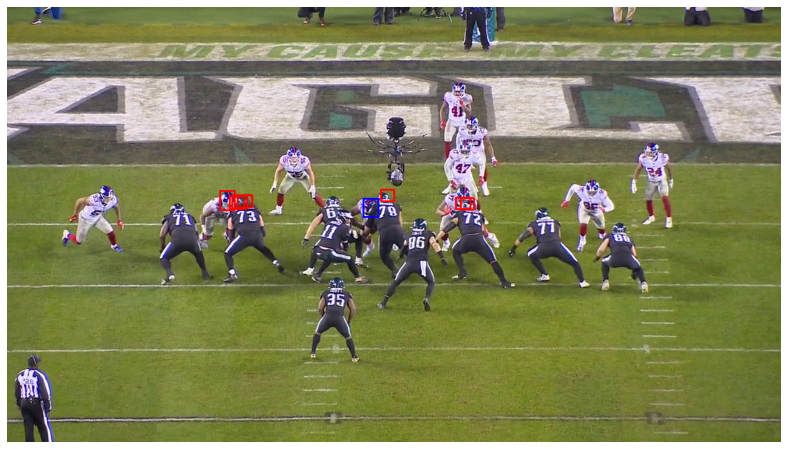

frame: 31
tp:0, fp:7, fn:1, precision:0.0, recall:0.0, f1_score:0.0


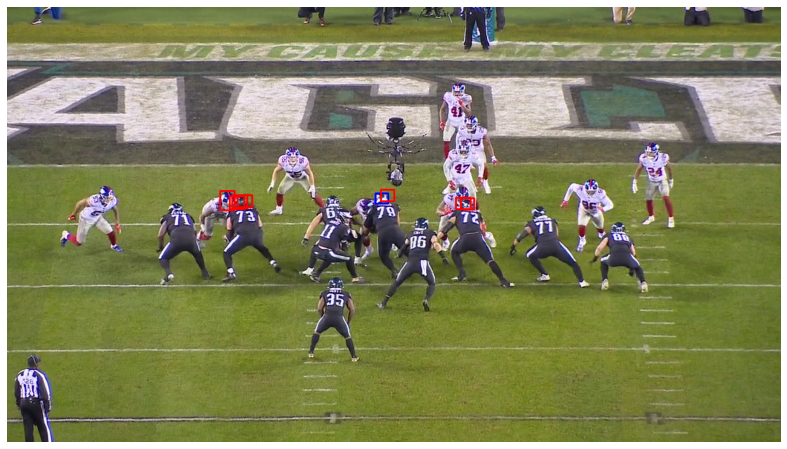

frame: 38
tp:2, fp:2, fn:0, precision:0.49999987500003124, recall:0.99999950000025, f1_score:0.6666660000003334


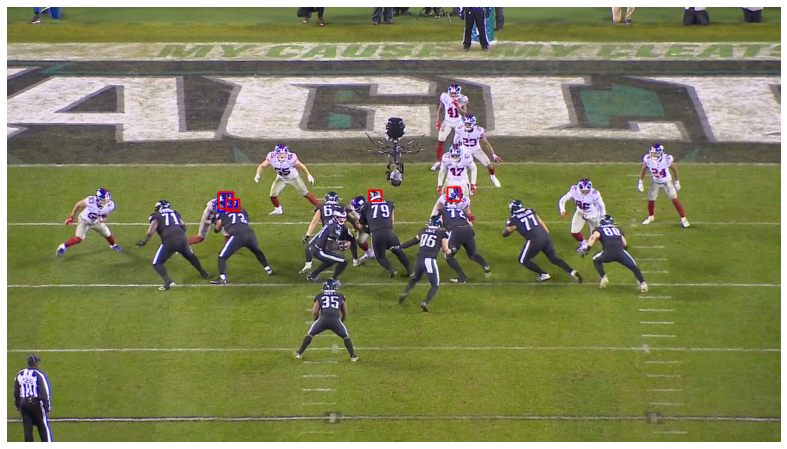

frame: 48
tp:1, fp:1, fn:0, precision:0.499999750000125, recall:0.9999990000010001, f1_score:0.6666657777782964


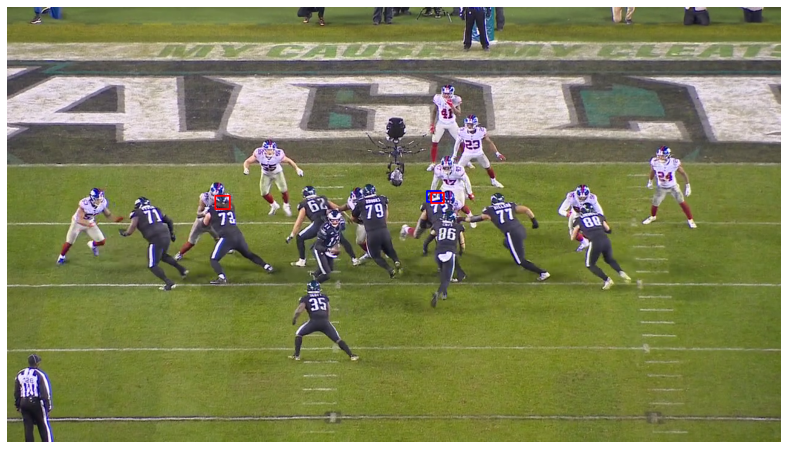

frame: 49
tp:0, fp:1, fn:1, precision:0.0, recall:0.0, f1_score:0.0


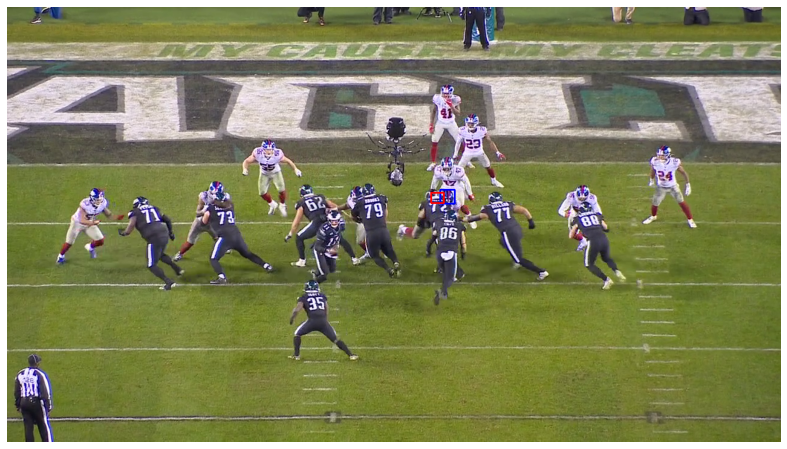

frame: 60
tp:2, fp:7, fn:0, precision:0.22222219753086697, recall:0.99999950000025, f1_score:0.36363600000018187


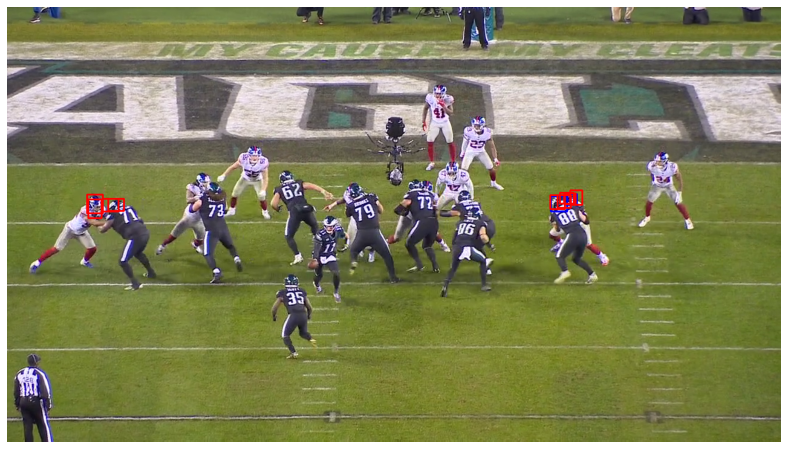

frame: 66
tp:2, fp:3, fn:0, precision:0.399999920000016, recall:0.99999950000025, f1_score:0.5714280000002858


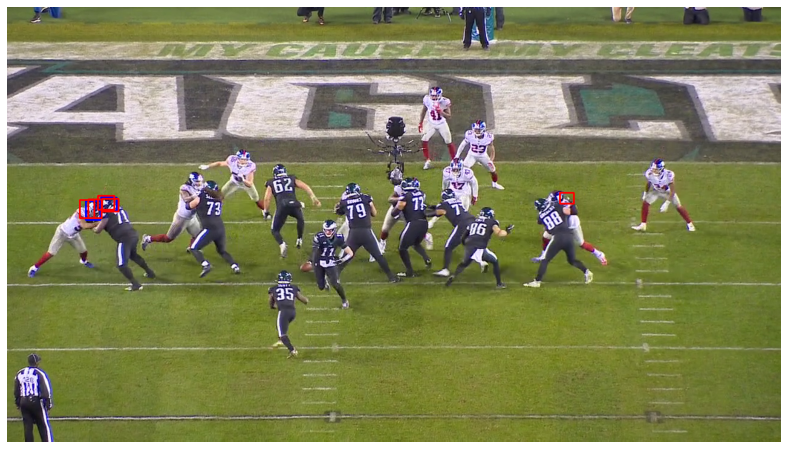

frame: 150
tp:0, fp:0, fn:1, precision:0.0, recall:0.0, f1_score:0.0


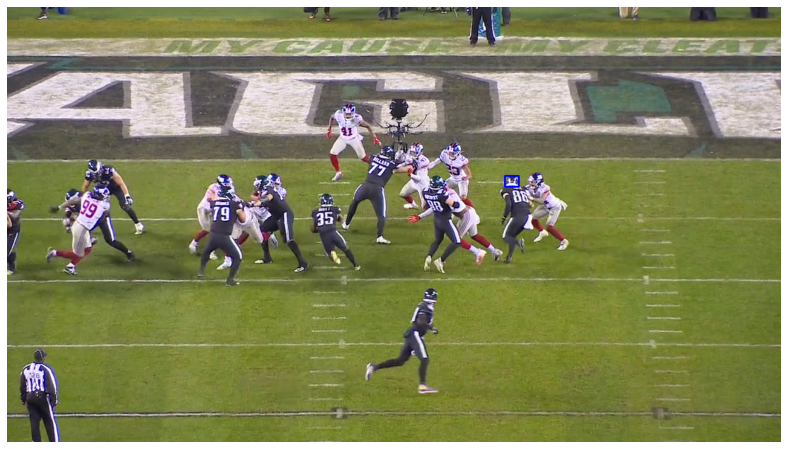

frame: 157
tp:0, fp:0, fn:1, precision:0.0, recall:0.0, f1_score:0.0


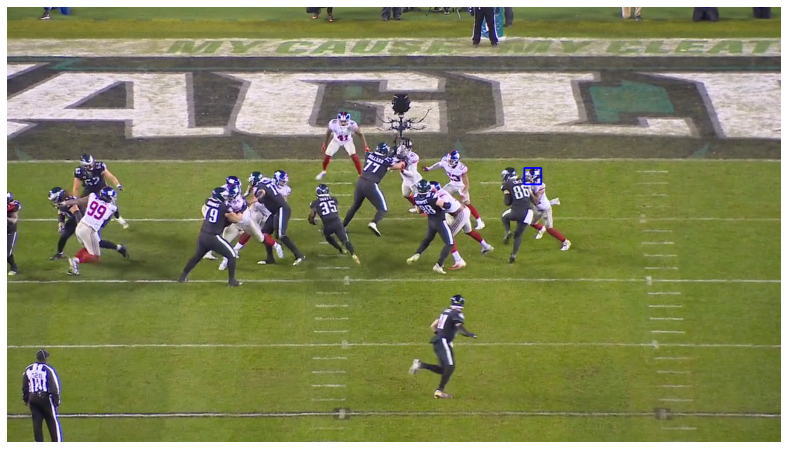

frame: 164
tp:1, fp:1, fn:1, precision:0.499999750000125, recall:0.499999750000125, f1_score:0.499999250000625


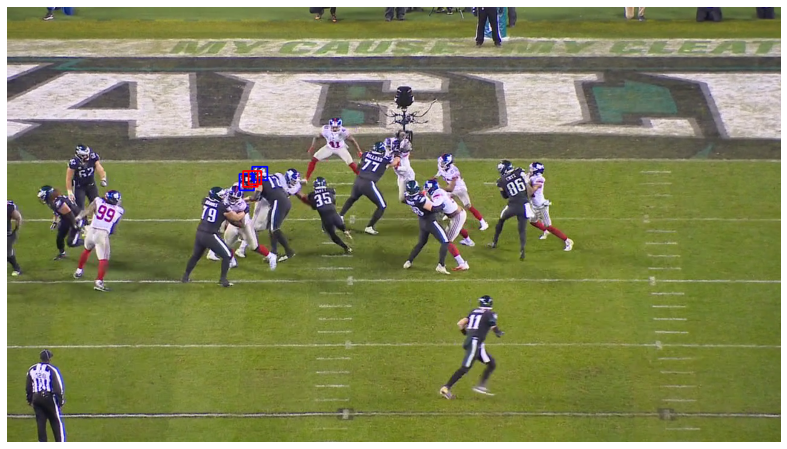

frame: 207
tp:0, fp:0, fn:1, precision:0.0, recall:0.0, f1_score:0.0


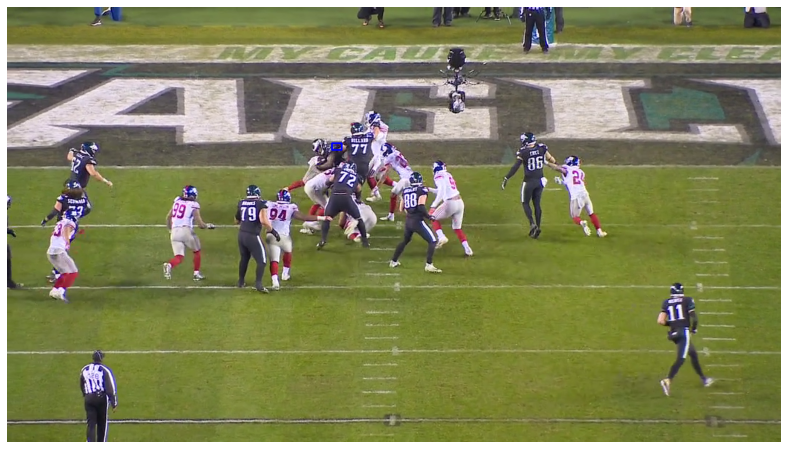

frame: 271
tp:0, fp:0, fn:2, precision:0.0, recall:0.0, f1_score:0.0


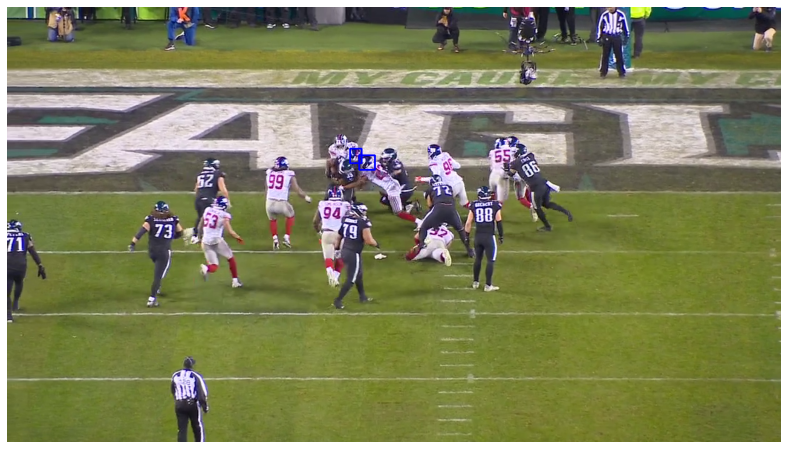

frame: 297
tp:0, fp:0, fn:1, precision:0.0, recall:0.0, f1_score:0.0


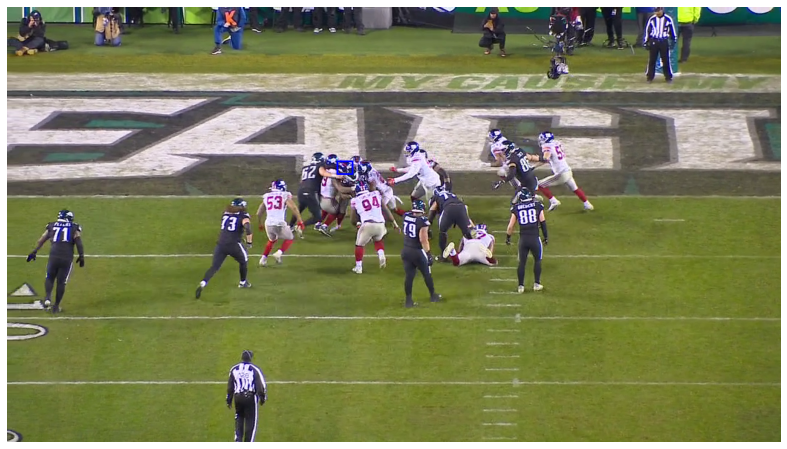

frame: 299
tp:0, fp:0, fn:2, precision:0.0, recall:0.0, f1_score:0.0


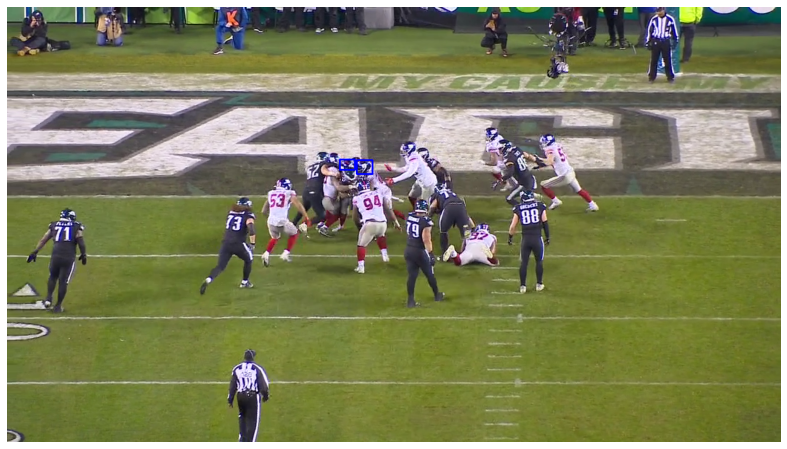

frame: 328
tp:0, fp:0, fn:1, precision:0.0, recall:0.0, f1_score:0.0


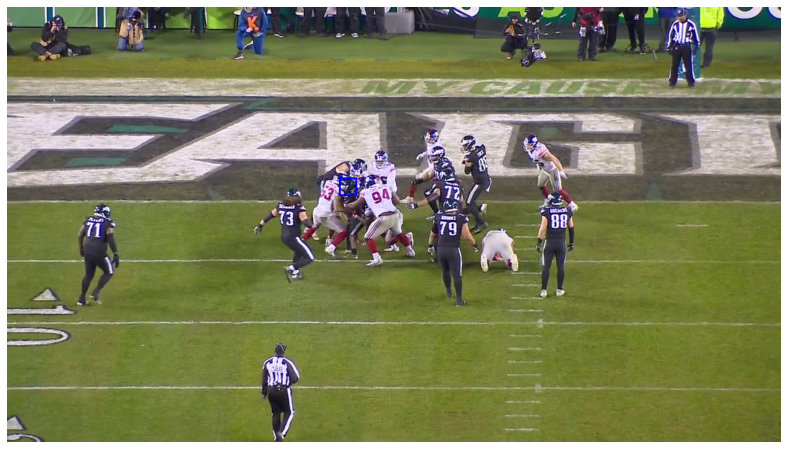

frame: 400
tp:0, fp:0, fn:1, precision:0.0, recall:0.0, f1_score:0.0


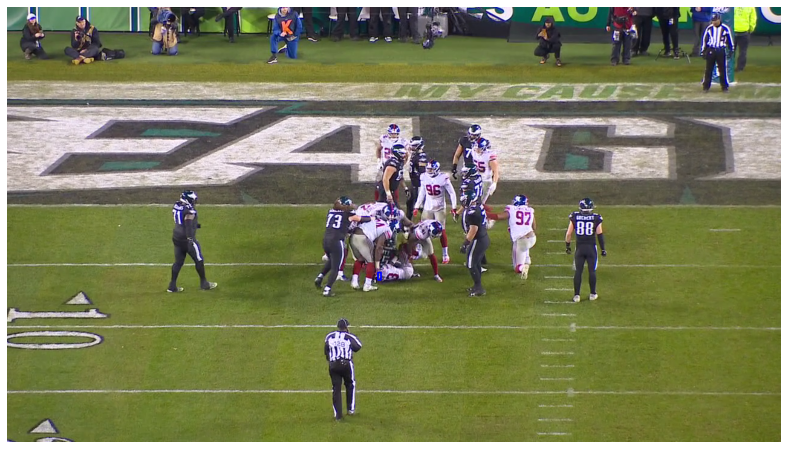

frame: 438
tp:0, fp:0, fn:1, precision:0.0, recall:0.0, f1_score:0.0


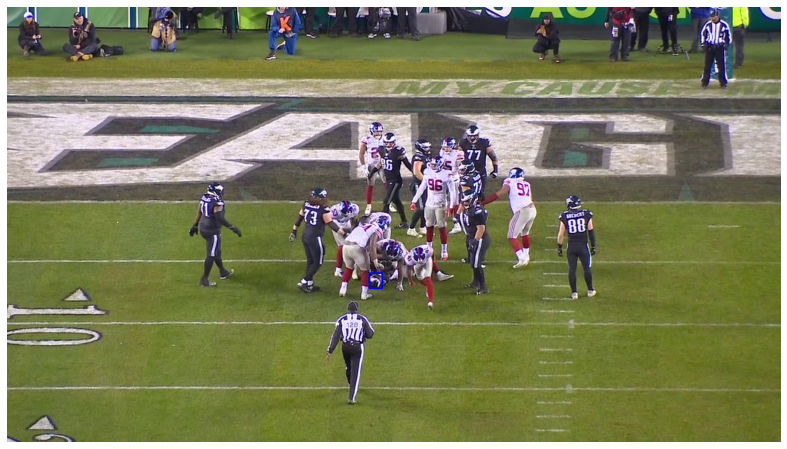

In [63]:
#check prediction
cnt = 0

labels_end = labels_valid[((labels_valid["video"]==videoend)&(labels_valid["impact"]==2))]

for image_id in labels_end.image_name.unique():
    image = cv2.imread(f'{DATA_ROOT_PATH}/{image_id}', cv2.IMREAD_COLOR).copy().astype(np.float32)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255.0
    sample = image
    fig, ax = plt.subplots(1, 1, figsize=(20, 8))
    sample = cv2.resize(sample , (int(1280), int(720)))
    # get gt
    gtboxes = labels_end[labels_end["image_name"]==image_id][['x', 'y', 'w', 'h', 'frame']].values
    gtboxes[:,2] = gtboxes[:,0] + gtboxes[:,2]
    gtboxes[:,3] = gtboxes[:,1] + gtboxes[:,3]
    for box in gtboxes:
        cv2.rectangle(sample, (box[0], box[1]), (box[2], box[3]), (0, 0, 1), 2)
    # plot preds
    frame = gtboxes[0,4]
    index = (pred_boxes[:,4] >= frame-4) * (pred_boxes[:,4] <= frame+4)
    preds = pred_boxes[index]
    print("frame:", frame)
    for box in preds:
        cv2.rectangle(sample, (box[0], box[1]), (box[2], box[3]), (1, 0, 0), 2)
        
    tp, fp, fn, precision, recall, f1_score = precision_calc(gtboxes, preds)
    print("tp:{}, fp:{}, fn:{}, precision:{}, recall:{}, f1_score:{}".format(tp, fp, fn, precision, recall, f1_score))
    ax.set_axis_off()
    ax.imshow(sample);
    plt.show()
    cnt += 1
    if cnt >= 40:
        break